# Customer Segmentation based on credit card data
# 1/ Exploratory Data Analysis

## Get started

In [ ]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
from matplotlib.cbook import boxplot_stats  
import seaborn as sns
from itertools import combinations
from sklearn.preprocessing import StandardScaler,normalize
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn_extra.cluster import KMedoids
from sklearn import cluster, mixture
from sklearn.metrics import silhouette_score
from scipy.spatial.distance import pdist, squareform
from scipy.stats import mannwhitneyu
from sklearn.neighbors import NearestNeighbors
from matplotlib import pyplot
from sklearn.ensemble import RandomForestClassifier
from functions import display_circles
%matplotlib inline

In [ ]:
df = pd.read_csv('drive/MyDrive/Colab Notebooks/dataset.csv')
df.head()

,CUST_ID,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
0,C10001,40.900749,0.818182,95.40,0.00,95.4,0.000000,0.166667,0.000000,0.083333,0.000000,0,2,1000.0,201.802084,139.509787,0.000000,12
1,C10002,3202.467416,0.909091,0.00,0.00,0.0,6442.945483,0.000000,0.000000,0.000000,0.250000,4,0,7000.0,4103.032597,1072.340217,0.222222,12
2,C10003,2495.148862,1.000000,773.17,773.17,0.0,0.000000,1.000000,1.000000,0.000000,0.000000,0,12,7500.0,622.066742,627.284787,0.000000,12
3,C10004,1666.670542,0.636364,1499.00,1499.00,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,NaN,0.000000,12
4,C10005,817.714335,1.000000,16.00,16.00,0.0,0.000000,0.083333,0.083333,0.000000,0.000000,0,1,1200.0,678.334763,244.791237,0.000000,12


Following is the Data Dictionary for the dataset :

- CUSTID : Identification of Credit Card holder (Categorical)
- BALANCE : Balance amount left in their account to make purchases (
- BALANCEFREQUENCY : How frequently the Balance is updated, score between 0 and 1 (1 = frequently updated, 0 = not frequently updated)
- PURCHASES : Amount of purchases made from account
- ONEOFFPURCHASES : Maximum purchase amount done in one-go
- INSTALLMENTSPURCHASES : Amount of purchase done in installment
- CASHADVANCE : Cash in advance given by the user
- PURCHASESFREQUENCY : How frequently the Purchases are being made, score between 0 and 1 (1 = frequently purchased, 0 = not frequently purchased)
- ONEOFFPURCHASESFREQUENCY : How frequently Purchases are happening in one-go (1 = frequently purchased, 0 = not frequently purchased)
- PURCHASESINSTALLMENTSFREQUENCY : How frequently purchases in installments are being done (1 = frequently done, 0 = not frequently done)
- CASHADVANCEFREQUENCY : How frequently the cash in advance being paid
- CASHADVANCETRX : Number of Transactions made with "Cash in Advanced"
- PURCHASESTRX : Number of purchase transactions made
- CREDITLIMIT : Limit of Credit Card for user
- PAYMENTS : Amount of Payment done by user
- MINIMUM_PAYMENTS : Minimum amount of payments made by user
- PRCFULLPAYMENT : Percent of full payment paid by user
- TENURE : Tenure of credit card service for user

## Data Description

Let's start by having a look on the structure of the dataset and the global quality.

### Basic Statistics

In [ ]:
df.describe()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
count,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8950.000000,8949.000000,8950.000000,8637.000000,8950.000000,8950.000000
mean,1564.474828,0.877271,1003.204834,592.437371,411.067645,978.871112,0.490351,0.202458,0.364437,0.135144,3.248827,14.709832,4494.449450,1733.143852,864.206542,0.153715,11.517318
std,2081.531879,0.236904,2136.634782,1659.887917,904.338115,2097.163877,0.401371,0.298336,0.397448,0.200121,6.824647,24.857649,3638.815725,2895.063757,2372.446607,0.292499,1.338331
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,50.000000,0.000000,0.019163,0.000000,6.000000
25%,128.281915,0.888889,39.635000,0.000000,0.000000,0.000000,0.083333,0.000000,0.000000,0.000000,0.000000,1.000000,1600.000000,383.276166,169.123707,0.000000,12.000000
50%,873.385231,1.000000,361.280000,38.000000,89.000000,0.000000,0.500000,0.083333,0.166667,0.000000,0.000000,7.000000,3000.000000,856.901546,312.343947,0.000000,12.000000
75%,2054.140036,1.000000,1110.130000,577.405000,468.637500,1113.821139,0.916667,0.300000,0.750000,0.222222,4.000000,17.000000,6500.000000,1901.134317,825.485459,0.142857,12.000000
max,19043.138560,1.000000,49039.570000,40761.250000,22500.000000,47137.211760,1.000000,1.000000,1.000000,1.500000,123.000000,358.000000,30000.000000,50721.483360,76406.207520,1.000000,12.000000


<b> No odd values detected at this step. We can see that the ranges of values for the payment and balance are very broad. </b>

Observations: 

- BALANCE : No negative values. The mean is about 1564 whereas the median is about 873, so we can already suspect this variable for having a distribution skewed to the right (high values).

- BALANCEFREQUENCY : The balance is mostly frequently updated.
    - <b> Should we remove the rows where the balance is not frequently updated to avoid having odd values? </b>
    
    
- PURCHASES : The mean is about 592 whereas the median is about 38, so we can already suspect this variable for having a distribution skewed to the right (high values). We can see a max value at 40761, that looks odd.    
- ONEOFFPURCHASES : Same comments than before.  
- INSTALLMENTSPURCHASES : Same comments than before.  
- CASHADVANCE : Same comments than before.
    -  <b> Investigate the extreme values. </b>
    
    
- PURCHASESFREQUENCY : The range of values is very broad for this variable, from 0 to 1 with a mean of 0.5.
- ONEOFFPURCHASESFREQUENCY : The range of values is very broad for this variable, from 0 to 1 with a mean of 0.08.
- PURCHASESINSTALLMENTSFREQUENCY : The range of values is very broad for this variable, from 0 to 1 with a mean of 0.16.
- CASHADVANCEFREQUENCY : The range of values is very broad for this variable, from 0 to 1 with a mean of 0.22.


- CASHADVANCETRX : We have some extreme values at 123, where the Q3 equals to 4.   
- PURCHASESTRX : We have some extreme values at 358, where the Q3 equals to 17.
    - <b> Investigate the extreme values. </b>
    
    
- CREDITLIMIT : The range of values is very broad for this variable, but looks ok as we know that depending on the card you can have various limits.


- PAYMENTS : We have some extreme values at 50721, where the Q3 equals to 1901.  
- MINIMUM_PAYMENTS : We have some extreme values at 76406, where the Q3 equals to 825.
    - <b> Investigate the extreme values. </b>
    
    
- PRCFULLPAYMENT : Most of users are not paying fully. Nothing looks odd.


- TENURE : Most of user have a value at 12. Few users have a value at 6. 
    - <b> Investigate the minimum value. </b>

### Distribution

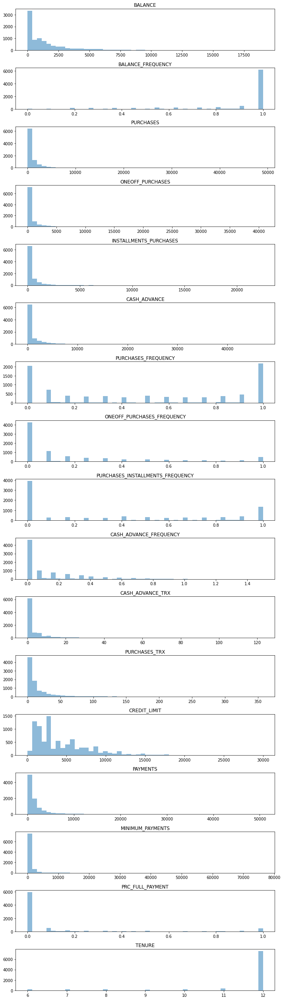

In [ ]:
# Basic Dataset
tmp = df.iloc[:,1:] # we remove the ID column for the distribution plot
n = len(df.columns)-1

# Check the Distribution for each columns
plt.figure(figsize=(10,35))
for i in range(n):
    plt.subplot(17,1,i+1)
    plt.hist(tmp[tmp.columns[i]],bins=50, alpha=0.5)
    plt.title(tmp.columns[i])
plt.tight_layout()

<b> Observations: </b>

- BALANCE : As expected, this variable has a distribution skewed to the right (high values) meaning that most of customers have a balance close to the lower values but few of them have a very large amount of money on their accounts. 
- BALANCEFREQUENCY : The balance is frequently updated for most of customers.
    
- PURCHASES, ONEOFFPURCHASES, INSTALLMENTSPURCHASES, CASHADVANCE : As expected, these variable have a distribution skewed to the right (high values). Meaning that the majority of customers are not spending a lot whereas a few of customers are spending a large amount of money.
    
- PURCHASESFREQUENCY, ONEOFFPURCHASESFREQUENCY,PURCHASESINSTALLMENTSFREQUENCY: The distribution for these variables looks like a smiling curve, with 3 'groups': one with a low frequency of purchase, one with a high frequency of purchase and the rest of the customers.

- CASHADVANCEFREQUENCY, CASHADVANCETRX : These variables have a distribution skewed to the right (high values) meaning that most of customers are not using frequently the advance in cash but few of them are using it more frequently.
  
- PURCHASESTRX : This variable has a distribution skewed to the right (high values).
- CREDITLIMIT : This variable has a distribution skewed to the right (high values) meaning that most of customers have a low credit limit whereas some of them have a very high limit.

- PAYMENTS, MINIMUM_PAYMENTS : We see again the same pattern, these variable have a distribution skewed to the right (high values) meaning that most of customers are making low values payments whereas a few of them are making ver large payments.   
    
- PRCFULLPAYMENT : Most of users are not paying fully. We can expect 3 groups of customers on this variable, low % of full payment, high and the rest.

- TENURE : Most of user have a value at 12.

### Outliers

Let's visualize the extreme values on a box-plot.

/usr/local/lib/python3.7/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)


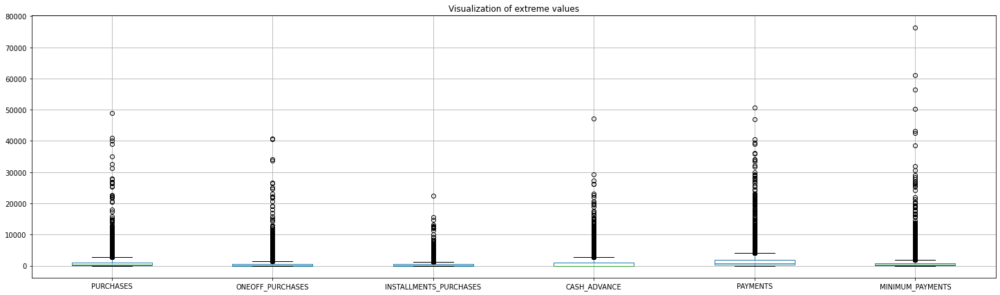

In [ ]:
tmp = df[['PURCHASES', 'ONEOFF_PURCHASES', 'INSTALLMENTS_PURCHASES','CASH_ADVANCE',
                     'PAYMENTS','MINIMUM_PAYMENTS']]

plt.figure(figsize=(25,7))
df.boxplot(column = tmp.columns.to_list())
plt.title('Visualization of extreme values')
plt.show()

<b> Having outliers on payment data make sense so we should keep them. </b> However, even among the extreme values we can see some extreme values, very distant from the rest of the data. Perhaps, these values could be removed from the dataset before the clustering. 

<b> In general, the outliers can interfere with the clustering depending on which algorithm we pick. </b> For example, Kmeans is sensitive to outliers because a mean is easily influenced by extreme values. So we will have to be careful in the choice of the classification algorithm.

### Missing Values

In [ ]:
# Check for each features
df.isna().sum()

In [ ]:
tmp = df[df['MINIMUM_PAYMENTS'].isna() == True].drop(['MINIMUM_PAYMENTS','CUST_ID','TENURE'],axis=1)
tmp.head()

,BALANCE,BALANCE_FREQUENCY,PURCHASES,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,PURCHASES_FREQUENCY,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,CASH_ADVANCE_TRX,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,PRC_FULL_PAYMENT
3,1666.670542,0.636364,1499.0,1499.0,0.0,205.788017,0.083333,0.083333,0.000000,0.083333,1,1,7500.0,0.000000,0.0
45,2242.311686,1.000000,437.0,97.0,340.0,184.648692,0.333333,0.083333,0.333333,0.166667,2,5,2400.0,0.000000,0.0
47,3910.111237,1.000000,0.0,0.0,0.0,1980.873201,0.000000,0.000000,0.000000,0.500000,7,0,4200.0,0.000000,0.0
54,6.660517,0.636364,310.0,0.0,310.0,0.000000,0.666667,0.000000,0.666667,0.000000,0,8,1000.0,417.016763,0.0
55,1311.995984,1.000000,1283.9,1283.9,0.0,0.000000,0.250000,0.250000,0.000000,0.000000,0,6,6000.0,0.000000,0.0


In [ ]:
len(df[(df['MINIMUM_PAYMENTS'].isna() == True) & (df['PAYMENTS'] == 0) & (df['PRC_FULL_PAYMENT'] == 0)])

In [ ]:
len(df[(df['MINIMUM_PAYMENTS'].isna() != 0) & (df['PAYMENTS'] == 0) & (df['MINIMUM_PAYMENTS'].isna() == False)])

<b> On 313 rows with missing values on MINIMUM PAYMENTS, 240 (so 77%) have a null value on PAYMENT. if PAYMENT equals zero, MINIMUM PAYMENT should also equal zero. So we could implement the missing values by zero. </b> For the rest of the missing values, we will use the median as the distribution for this variable is clearly skewed (cf. below).

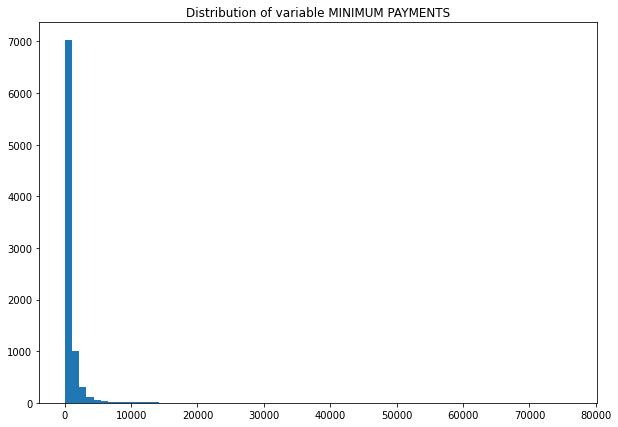

In [ ]:
# Check the distribution for the Minimum Payments column
plt.figure(figsize=(10,7))
plt.hist(df['MINIMUM_PAYMENTS'],bins= 70)
plt.title('Distribution of variable MINIMUM PAYMENTS')
plt.show()

In [ ]:
# Implement the missing values
df['MINIMUM_PAYMENTS'] = np.where((df['MINIMUM_PAYMENTS'].isna() == True) & (df['PAYMENTS'] == 0),0,df['MINIMUM_PAYMENTS'].median())

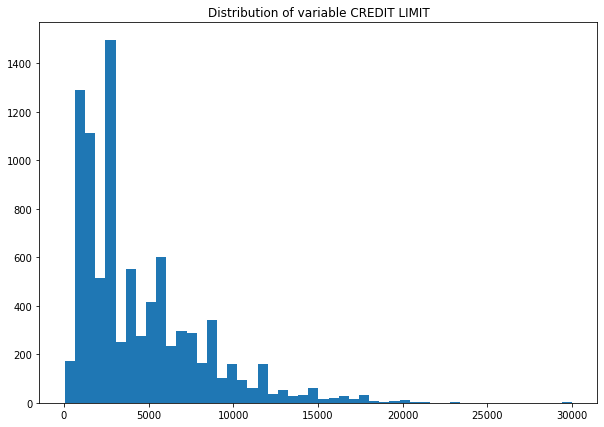

In [ ]:
# Check the distribution for the CREDIT LIMIT column
plt.figure(figsize=(10,7))
plt.hist(df['CREDIT_LIMIT'],bins= 50)
plt.title('Distribution of variable CREDIT LIMIT')
plt.show()

<b> The column is clearly skewed to the right, due to very high CREDIT LIMIT. </b> We can see the impact of the skewness on the mean: the mean is much higher than the median. Considering that, and because there is only 1 value missing, we replace it by the median of the column.

In [ ]:
# Replace NaN values for CREDIT LIMIT
df['CREDIT_LIMIT'] = df['CREDIT_LIMIT'].fillna(df['CREDIT_LIMIT'].median())

## Bivariate Analysis

### Pairplot

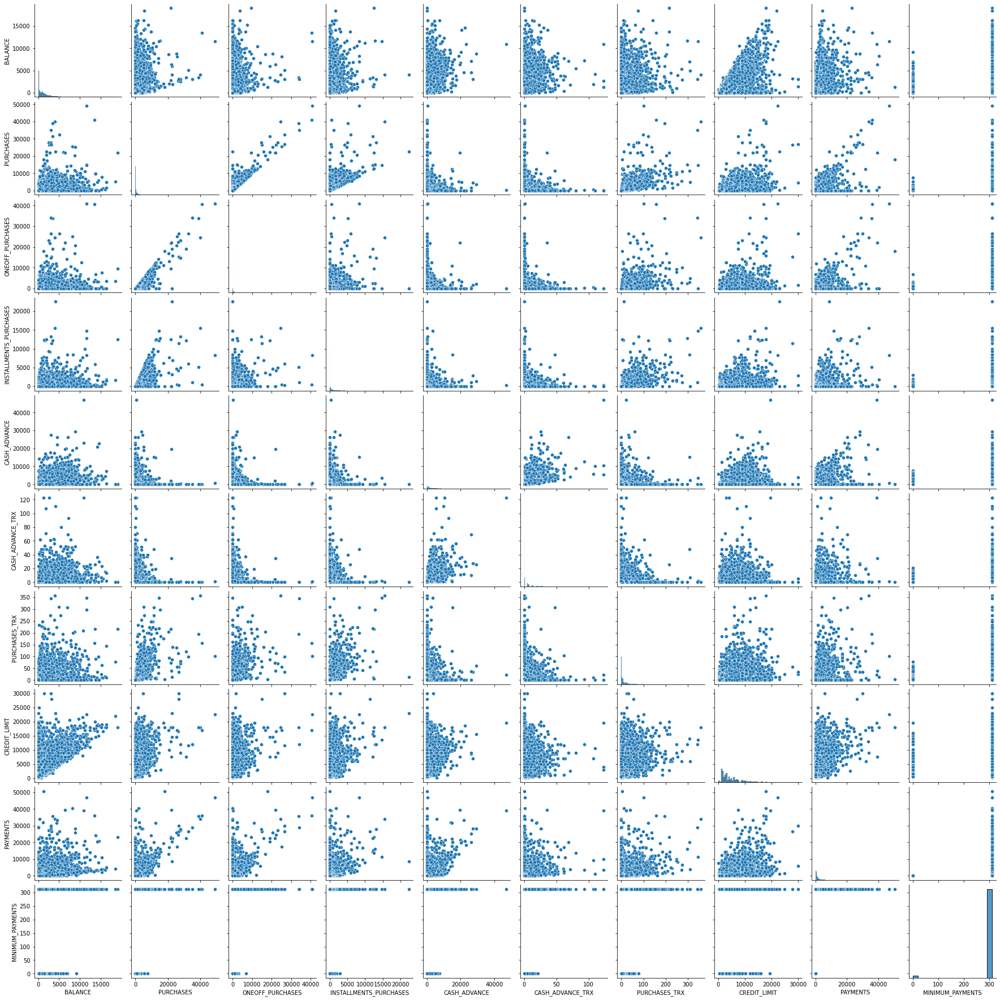

In [ ]:
tmp = df.set_index(['CUST_ID','BALANCE_FREQUENCY','PURCHASES_FREQUENCY','ONEOFF_PURCHASES_FREQUENCY',
       'PURCHASES_INSTALLMENTS_FREQUENCY', 'CASH_ADVANCE_FREQUENCY','TENURE','PRC_FULL_PAYMENT']) #We exclude these columns from the pairplot
sns.pairplot(tmp)

<b> It looks like there is a linear relation between PURCHASES and ONEOFF_PURCHASES </b>

### Correlations

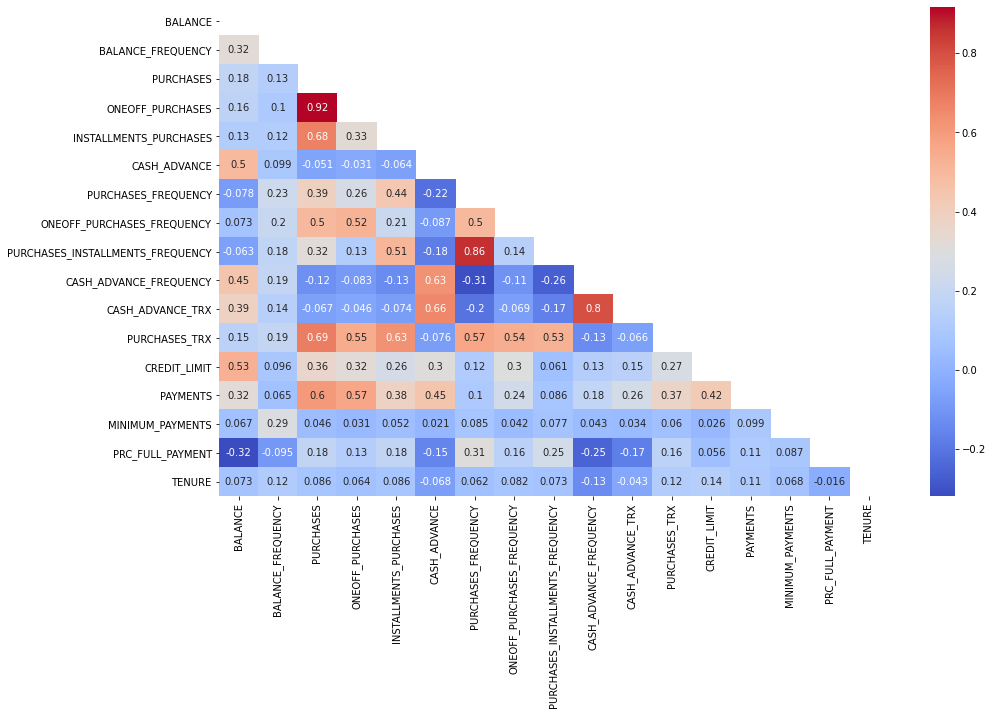

In [ ]:
# Heatmap of correlation matrix
mask = np.triu(np.ones_like(df.corr(), dtype=bool)) # Generate a mask for the upper triangle
plt.figure(figsize=(15,9))
sns.heatmap(df.corr(),mask=mask, annot = True,cmap= 'coolwarm')
plt.show()

<b> Observations</b>

The following variables are highly correlated together:
- ONEOFF_PURCHASES | PURCHASES 
    - This is expected as PURCHASES incl. ONEOFF_PURCHASES.
    
- PURCHASES_INSTALLMENTS_FREQUENCY | PURCHASES_FREQUENCY
    - This is expected as PURCHASES_FREQUENCY incl. PURCHASES_INSTALLMENTS_FREQUENCY.
    
- CASH_ADVANCE_TRX | CASH_ADVANCE_FREQUENCY
    - This is expected as the more customers are using cash advance for their payment the more the frequency will increase.

- There is a medium correlation between PURCHASES_TRX and PURCHASES, INSTALLMENTS_PURCHASES
    - Again, we can expect a correlation between these variables for the same reasons than above.

<b> We decide to remove the variables: CASH_ADVANCE_TRX, PURCHASE_FREQUENCY and ONEOFF_PURCHASES to avoid redundancy. </b> 

In [ ]:
df.drop(['CASH_ADVANCE_TRX', 'PURCHASES_FREQUENCY','PURCHASES'],axis= 1, inplace=True)

# Preprocessing

## Normalization

In [ ]:
# Normalized the data
mask = df.columns[1:]
df[mask] = normalize(df[mask])
df =  df.set_index('CUST_ID')
df.head()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,
C10001,0.038153,0.000763,0.000000,0.088992,0.000000,0.000000,0.000078,0.000000,0.001866,0.932827,0.188246,0.291363,0.00000,0.011194
C10002,0.295187,0.000084,0.000000,0.000000,0.593877,0.000000,0.000000,0.000023,0.000000,0.645223,0.378196,0.028790,0.00002,0.001106
C10003,0.312975,0.000125,0.096981,0.000000,0.000000,0.000125,0.000000,0.000000,0.001505,0.940751,0.078028,0.039178,0.00000,0.001505
C10004,0.212842,0.000081,0.191430,0.000000,0.026280,0.000011,0.000000,0.000011,0.000128,0.957789,0.000000,0.000000,0.00000,0.001532
C10005,0.500737,0.000612,0.009798,0.000000,0.000000,0.000051,0.000000,0.000000,0.000612,0.734835,0.415387,0.191268,0.00000,0.007348


## Find number of clusters

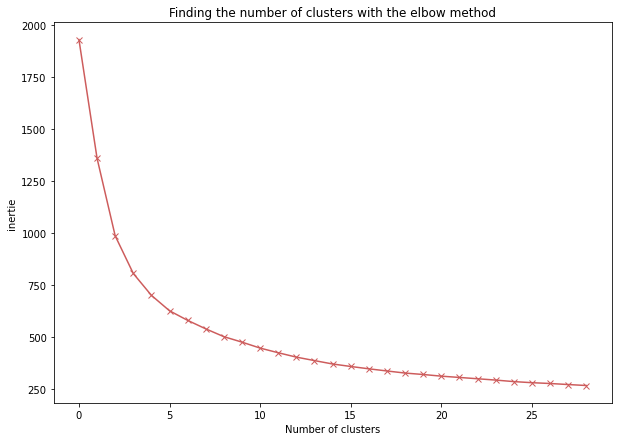

In [ ]:
# Elbow plot to find number of clusters 
n_clusters=30
cost=[]

for i in range(1,n_clusters):
    kmean= KMeans(i)
    kmean.fit(df)
    cost.append(kmean.inertia_) 

plt.figure(figsize=(10,7))
plt.plot(cost, 'bx-',color='indianred')
plt.title('Finding the number of clusters with the elbow method')
plt.xlabel('Number of clusters')
plt.ylabel('inertie')
plt.show()

<b> From the elbow plot we can see that the ideal number of clusters for these dataset is about 5 clusters. </b> 

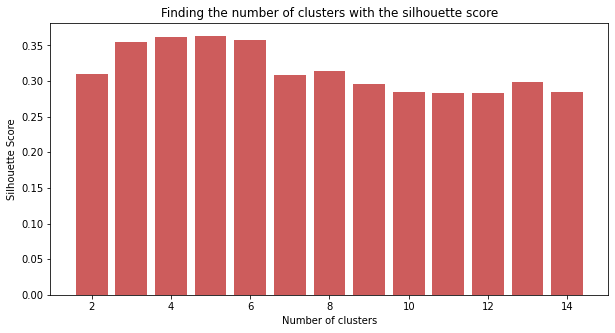

In [ ]:
# Try to find the number of clusters with the silhouette coefficient method
silhouette_scores = [] 

for n_cluster in range(2, 15):
    silhouette_scores.append( 
        silhouette_score(df, KMeans(n_clusters = n_cluster).fit_predict(df))) 
    
    # Plot the results 
k = np.arange(2,15)
plt.figure(figsize=(10,5))
plt.bar(k, silhouette_scores,color = 'indianred')
plt.title('Finding the number of clusters with the silhouette score')
plt.xlabel('Number of clusters', fontsize = 10) 
plt.ylabel('Silhouette Score', fontsize = 10) 
plt.show() 

<b> From the silhouette method we can see that the ideal number of clusters for these dataset is also about 4 to 5 clusters. </b> 

## Find the best Epsilon for DBSCAN

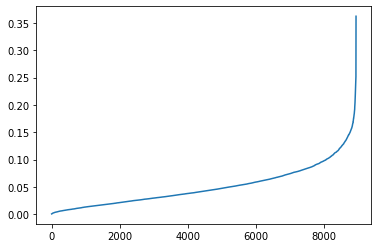

In [ ]:
# Calculate the distance from each point to its closest neighbour
neigh = NearestNeighbors(n_neighbors=20)
nbrs = neigh.fit(df)
distances, indices = nbrs.kneighbors(df)

# Plot the results
distances = np.sort(distances, axis=0)
distances = distances[:,1]
plt.plot(distances)
plt.show()

The optimal value for epsilon will be found at the point of maximum curvature. Here it's about 0.15.

# Classification

## Settings

In [ ]:
# Parameters
rds = np.random.RandomState(42)
nc = 5 #Determined by the elbow and silhouette methods
miter = 1000 #If you keep max_iter at a higher value, then you are guaranteed that you have explored the entire feature space
ni = 25 #the algorithm will initialize the centroids 25 times and will pick the most converging value as the best fit
eps = 0.125 #Determined above
min_sample = 20 #for DBSCAN

Few rules of thumb for selecting the MinPts (min_sample) value:
- The larger the data set, the larger the value of MinPts should be
- If the data set is noisier, choose a larger value of MinPts
- Generally, MinPts should be greater than or equal to the dimensionality of the data set
- For 2-dimensional data, use DBSCAN’s default value of MinPts = 4 (Ester et al., 1996).
- If your data has more than 2 dimensions, choose MinPts = 2*dim, where dim= the dimensions of your data set (Sander et al., 1998).

## Clustering

In [ ]:
# Fit Models
km = KMeans(n_clusters=nc,n_init=ni, max_iter = miter, random_state= rds,init='k-means++').fit(df) 
  #Kmeans++ ensures a smarter initialization of the centroids and improves the quality of the clustering.

kme = KMedoids(n_clusters=nc,max_iter = miter, method= 'pam', random_state= rds, init='k-medoids++').fit(df) 
  # Method ‘alternate’ is faster while ‘pam’ is more accurate.
  # ‘k-medoids++’gives initial medoids which are more separated than those generated by the other methods.

spectral = cluster.SpectralClustering(n_clusters=nc, n_init=ni, affinity="nearest_neighbors",random_state=rds).fit(df)
ward = cluster.AgglomerativeClustering(n_clusters=nc, linkage='ward').fit(df)
dbscan = cluster.DBSCAN(eps= eps, min_samples=min_sample).fit(df)

In [ ]:
# Create columns with the corresponding cluster label in the dataset
df["SpectralClustering"] = spectral.labels_ +1
df["AgglomerativeClustering"] = ward.labels_ +1
df["DBSCAN"] = dbscan.labels_+2
df["K-Medoid"] = kme.labels_ +1
df["K-Means"] = km.labels_ +1 
df.head()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE,SpectralClustering,AgglomerativeClustering,DBSCAN,K-Medoid,K-Means
CUST_ID,,,,,,,,,,,,,,,,,,,
C10001,0.038153,0.000763,0.000000,0.088992,0.000000,0.000000,0.000078,0.000000,0.001866,0.932827,0.188246,0.291363,0.00000,0.011194,1,4,2,1,2
C10002,0.295187,0.000084,0.000000,0.000000,0.593877,0.000000,0.000000,0.000023,0.000000,0.645223,0.378196,0.028790,0.00002,0.001106,4,5,2,4,3
C10003,0.312975,0.000125,0.096981,0.000000,0.000000,0.000125,0.000000,0.000000,0.001505,0.940751,0.078028,0.039178,0.00000,0.001505,3,1,2,1,2
C10004,0.212842,0.000081,0.191430,0.000000,0.026280,0.000011,0.000000,0.000011,0.000128,0.957789,0.000000,0.000000,0.00000,0.001532,1,1,2,1,2
C10005,0.500737,0.000612,0.009798,0.000000,0.000000,0.000051,0.000000,0.000000,0.000612,0.734835,0.415387,0.191268,0.00000,0.007348,2,1,1,5,4


In [ ]:
# Clusters Sizes
idx = pd.Series([1,2,3,4,5])
frame = {'index':idx }
size = pd.DataFrame(frame)

for col in df.iloc[:,-5:].columns:
    tmp = pd.DataFrame(df.groupby(col).count().reset_index().iloc[:,:2].rename(columns={col:'index','BALANCE':col}))
    size = size.merge(tmp, on='index',how='left')
    size.fillna(0,inplace=True)
    
size

,index,SpectralClustering,AgglomerativeClustering,DBSCAN,K-Medoid,K-Means
0,1,1984,2076,1813.0,2984,1378
1,2,2018,1745,7086.0,1278,3417
2,3,3182,1083,30.0,1707,1222
3,4,1679,3268,21.0,957,2070
4,5,87,778,0.0,2024,863


## Dimensionnality Reduction with PCA

In [ ]:
# Get only the features
tmp = df.iloc[:,:-5]
tmp.head()

,BALANCE,BALANCE_FREQUENCY,ONEOFF_PURCHASES,INSTALLMENTS_PURCHASES,CASH_ADVANCE,ONEOFF_PURCHASES_FREQUENCY,PURCHASES_INSTALLMENTS_FREQUENCY,CASH_ADVANCE_FREQUENCY,PURCHASES_TRX,CREDIT_LIMIT,PAYMENTS,MINIMUM_PAYMENTS,PRC_FULL_PAYMENT,TENURE
CUST_ID,,,,,,,,,,,,,,
C10001,0.038153,0.000763,0.000000,0.088992,0.000000,0.000000,0.000078,0.000000,0.001866,0.932827,0.188246,0.291363,0.00000,0.011194
C10002,0.295187,0.000084,0.000000,0.000000,0.593877,0.000000,0.000000,0.000023,0.000000,0.645223,0.378196,0.028790,0.00002,0.001106
C10003,0.312975,0.000125,0.096981,0.000000,0.000000,0.000125,0.000000,0.000000,0.001505,0.940751,0.078028,0.039178,0.00000,0.001505
C10004,0.212842,0.000081,0.191430,0.000000,0.026280,0.000011,0.000000,0.000011,0.000128,0.957789,0.000000,0.000000,0.00000,0.001532
C10005,0.500737,0.000612,0.009798,0.000000,0.000000,0.000051,0.000000,0.000000,0.000612,0.734835,0.415387,0.191268,0.00000,0.007348


In [ ]:
# Obtain the principal components 
pca = PCA(n_components=6)
principal_comp = pca.fit_transform(tmp)
pca_df = pd.DataFrame(data=principal_comp,columns=['pca1','pca2','pca3','pca4','pca5','pca6'])

# Add index
pca_df = pd.concat([pca_df,pd.DataFrame({'CUST_ID':tmp.reset_index().iloc[:,0]})], axis = 1).set_index('CUST_ID')
pca_df.head()

,pca1,pca2,pca3,pca4,pca5,pca6
CUST_ID,,,,,,
C10001,-0.314843,0.060005,0.046013,-0.089539,-0.030853,0.190665
C10002,0.344341,-0.074399,0.349415,0.012054,-0.009059,-0.052318
C10003,-0.219486,-0.176295,-0.103389,0.068823,-0.049621,-0.043506
C10004,-0.297950,-0.156612,-0.045658,0.173955,0.025260,-0.064619
C10005,0.137121,-0.037934,-0.221966,-0.088559,-0.188661,0.080772


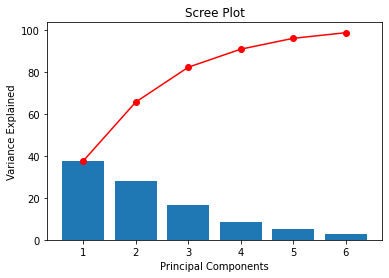

In [ ]:
# Create scree plot
scree = pca.explained_variance_ratio_*100
plt.bar(np.arange(len(scree))+1, scree)
plt.plot(np.arange(len(scree))+1, scree.cumsum(),c="red",marker='o')
plt.xlabel("Principal Components")
plt.ylabel("Variance Explained")
plt.title("Scree Plot")
plt.show(block=False)

<b> About 90% of the variance can be explained by the first 4 principal components. </b> 

In [ ]:
# Let's interpret the 4 PCs 
F1 = pca.components_[0]
F2 = pca.components_[1]
F3 = pca.components_[2]
F4 = pca.components_[3]

pd.DataFrame({'F1':F1,'F2':F2,'F3':F3,'F4':F4}, np.array(tmp.columns))

,F1,F2,F3,F4
BALANCE,0.509168,-0.586345,-0.568221,-0.071006
BALANCE_FREQUENCY,0.000054,-0.000025,-0.000256,-0.000375
ONEOFF_PURCHASES,0.039588,0.250611,-0.271236,0.818832
INSTALLMENTS_PURCHASES,-0.027372,0.217133,-0.167627,-0.516755
CASH_ADVANCE,0.463881,-0.244169,0.753230,0.108161
ONEOFF_PURCHASES_FREQUENCY,0.000003,0.000074,-0.000103,0.000253
PURCHASES_INSTALLMENTS_FREQUENCY,-0.000119,0.000153,-0.000146,-0.000567
CASH_ADVANCE_FREQUENCY,0.000084,-0.000057,0.000077,0.000005
PURCHASES_TRX,-0.000779,0.006089,-0.007204,-0.002904
CREDIT_LIMIT,-0.579712,-0.206805,0.057789,-0.016032


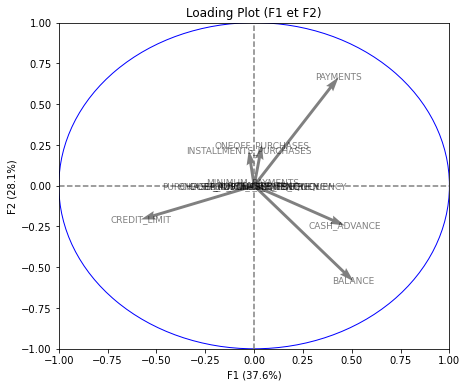

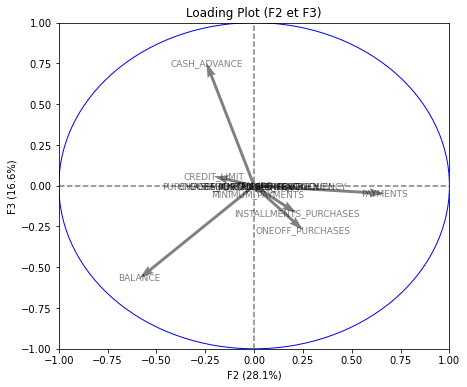

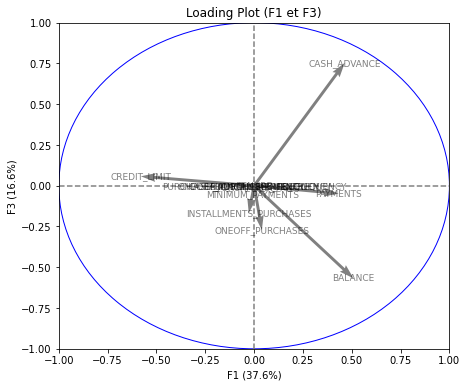

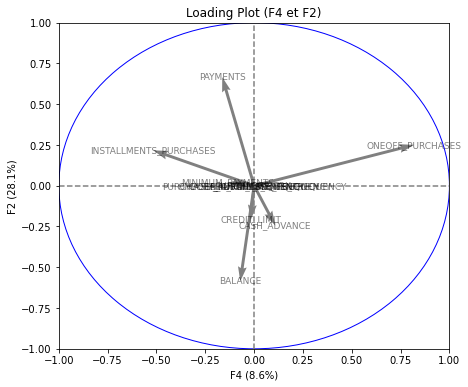

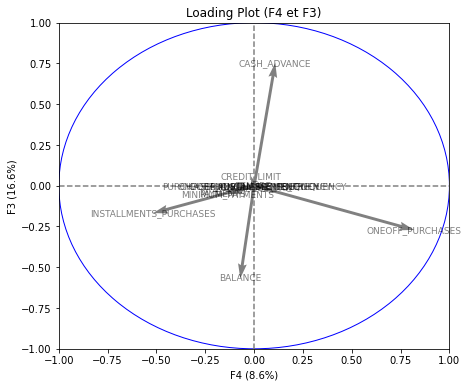

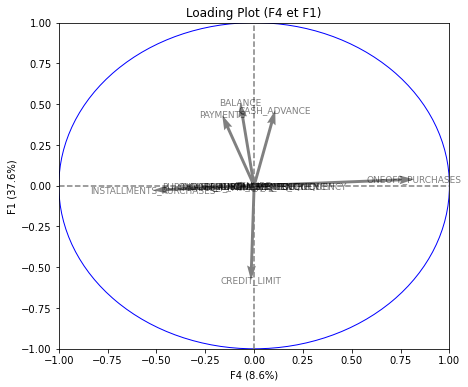

In [ ]:
# Visualize the data from the first 4 PCs into Loadings Plots
pcs = pca.components_
display_circles(pcs, 6, pca, [(0,1),(1,2),(0,2),(3,1),(3,2),(3,0)], labels = np.array(tmp.columns))

<b> Analysis of the PCs: What are the most important features to explain the variability? </b>
- F1 : Credit Limit, Balance, Cash advance and Payments.
- F2 : Balance, Cash advance and Payments.
- F3: Balance, Cash advance. 
- F4: Installments Purchases and OneOff Purchases.

In [ ]:
# Concatenate the clusters labels to the dataframe
pca_df2 = pd.concat([pca_df,df.iloc[:,-5:]], axis = 1)
pca_df2.head()

,pca1,pca2,pca3,pca4,pca5,pca6,SpectralClustering,AgglomerativeClustering,DBSCAN,K-Medoid,K-Means
CUST_ID,,,,,,,,,,,
C10001,-0.314843,0.060005,0.046013,-0.089539,-0.030853,0.190665,1,4,2,1,2
C10002,0.344341,-0.074399,0.349415,0.012054,-0.009059,-0.052318,4,5,2,4,3
C10003,-0.219486,-0.176295,-0.103389,0.068823,-0.049621,-0.043506,3,1,2,1,2
C10004,-0.297950,-0.156612,-0.045658,0.173955,0.025260,-0.064619,1,1,2,1,2
C10005,0.137121,-0.037934,-0.221966,-0.088559,-0.188661,0.080772,2,1,1,5,4


## Visualization of clusters

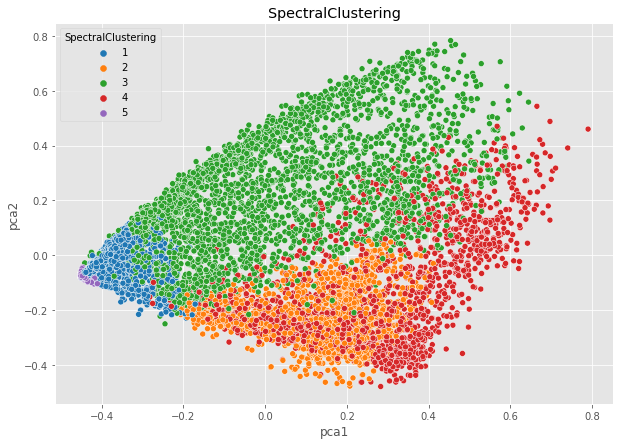

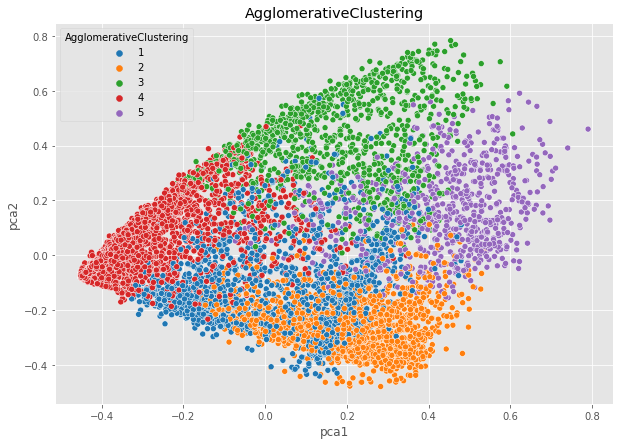

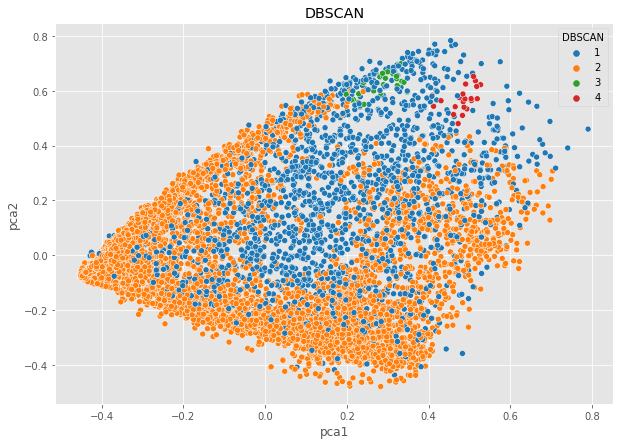

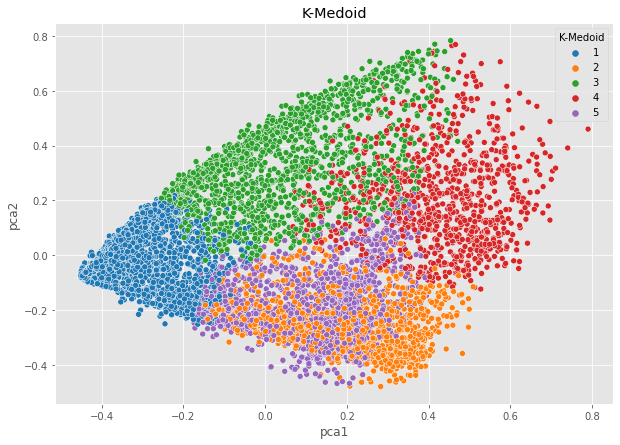

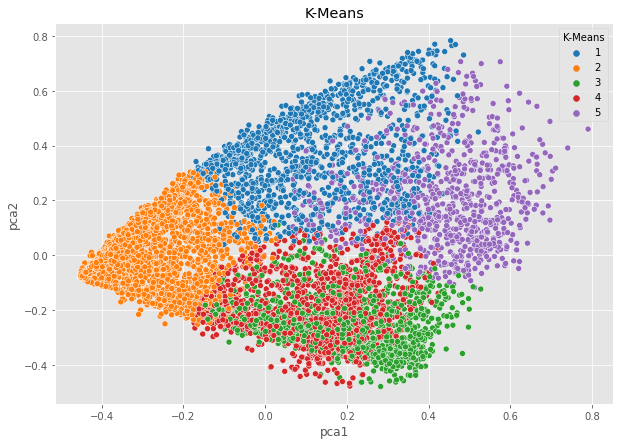

In [ ]:
# Visualization of clusters on the first PCs
for col in pca_df2.iloc[:,-5:]:
    plt.figure(figsize=(10, 7)) 
    plt.style.use('ggplot')
    ax = sns.scatterplot(x="pca1", y="pca2", hue = col, data = pca_df2, palette = 'tab10')
    ax.set_title(col)
    plt.show()

<b> In the plan 1 & 2, we can visualize a pretty good partitionning for the following algorithm : </b>
- Spectral clustering
- Kmedoids
- Robust Kmeans
- Kmeans

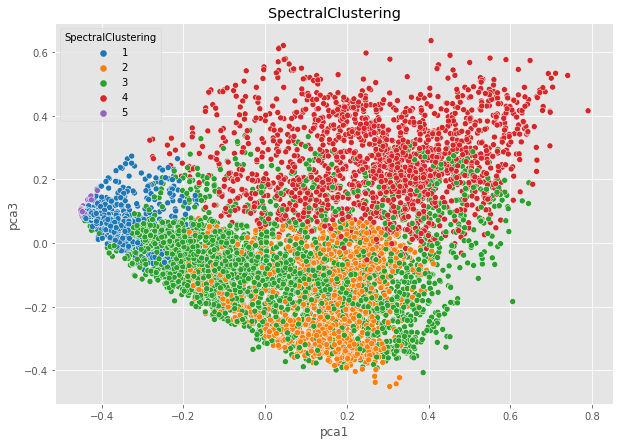

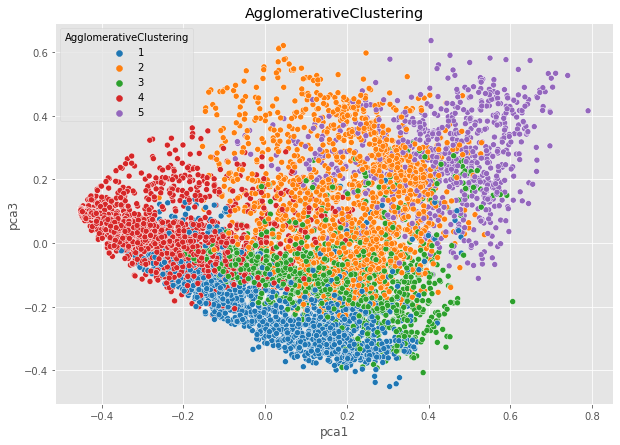

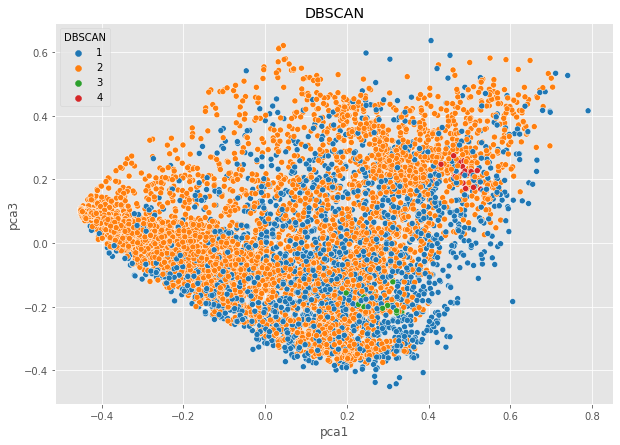

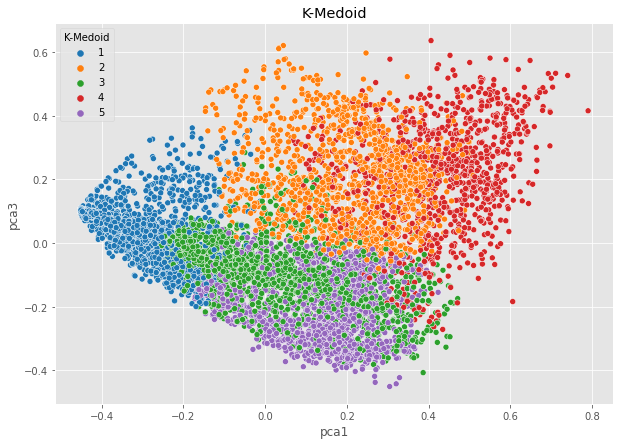

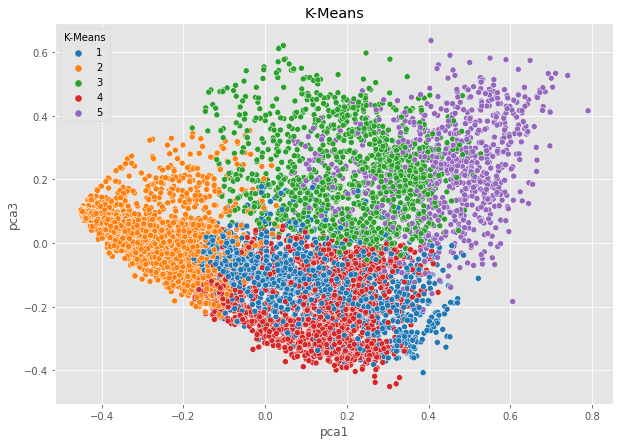

In [ ]:
# Visualization of clusters on the PCA 1 & 3
for col in pca_df2.iloc[:,-5:]:
    plt.figure(figsize=(10, 7)) 
    plt.style.use('ggplot')
    ax = sns.scatterplot(x="pca1", y="pca3", hue = col, data = pca_df2, palette = 'tab10')
    ax.set_title(col)
    plt.show()

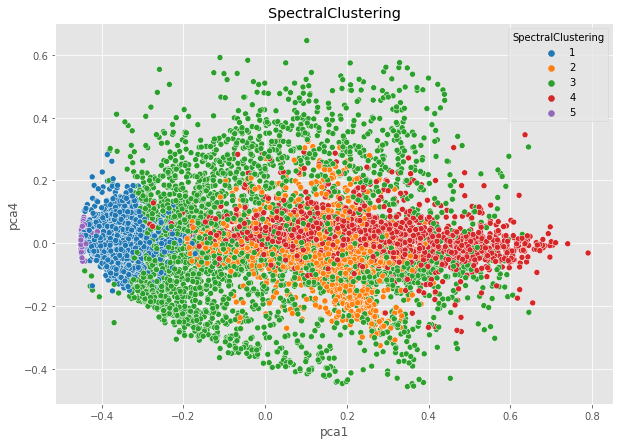

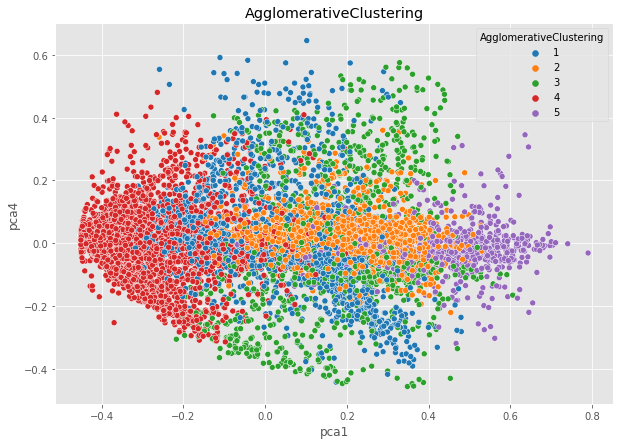

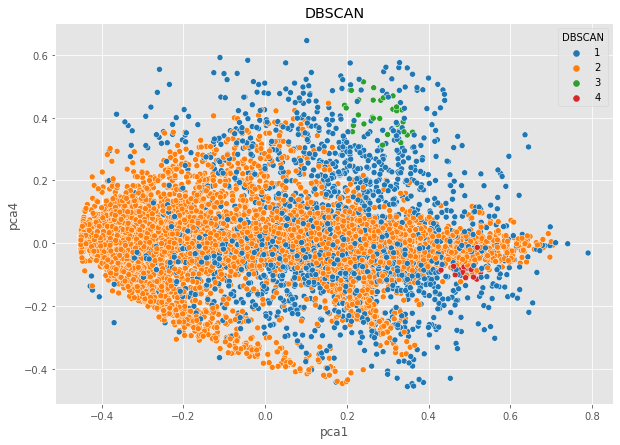

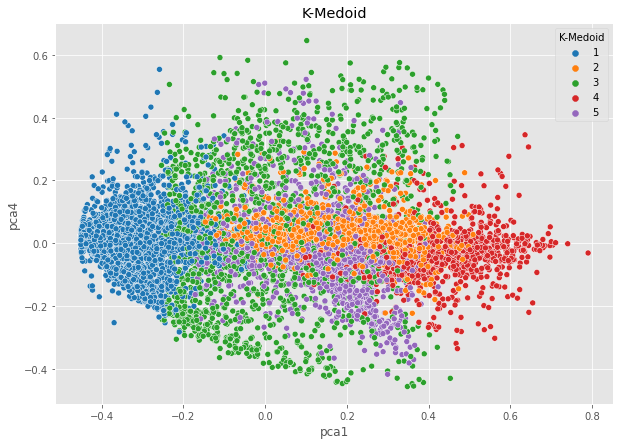

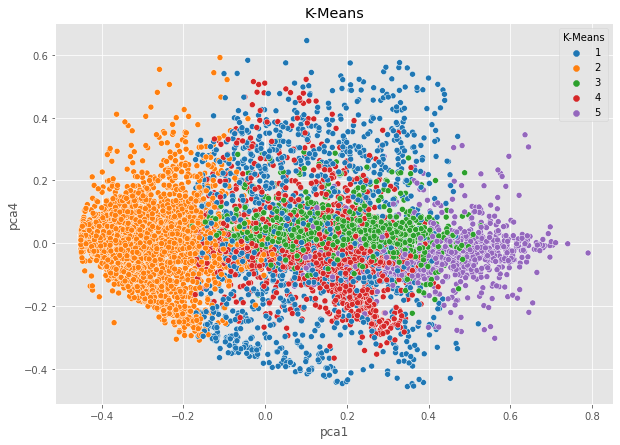

In [ ]:
# Visualization of clusters on the first PCs
for col in pca_df2.iloc[:,-5:]:
    plt.figure(figsize=(10, 7)) 
    plt.style.use('ggplot')
    ax = sns.scatterplot(x="pca1", y="pca4", hue = col, data = pca_df2, palette = 'tab10')
    ax.set_title(col)
    plt.show()

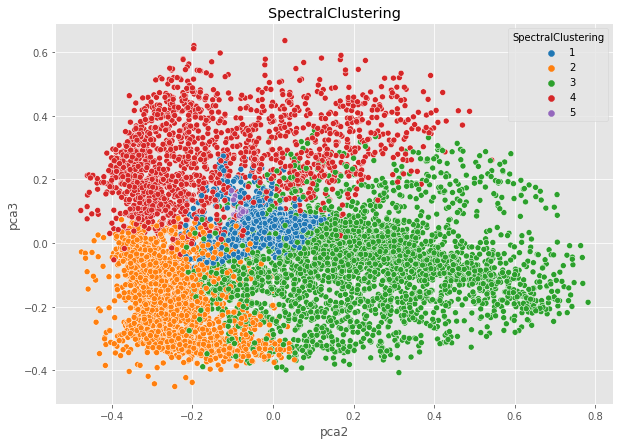

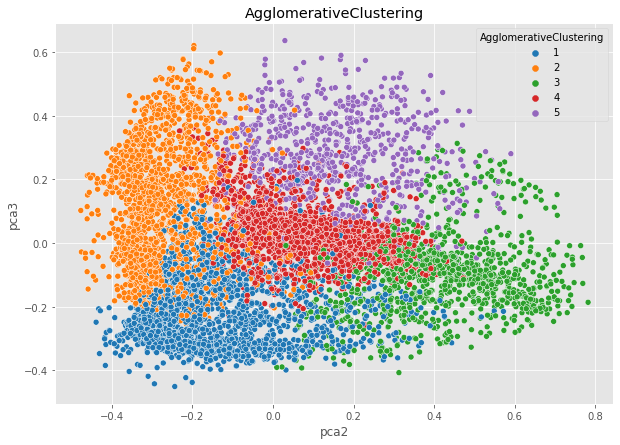

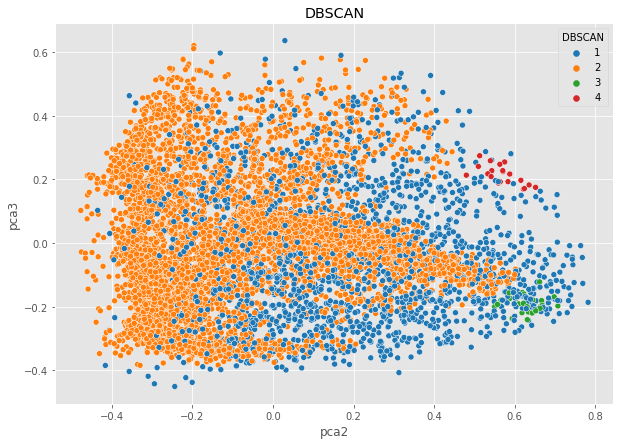

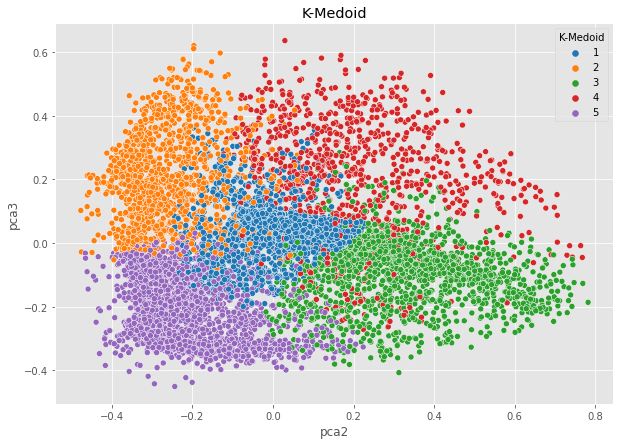

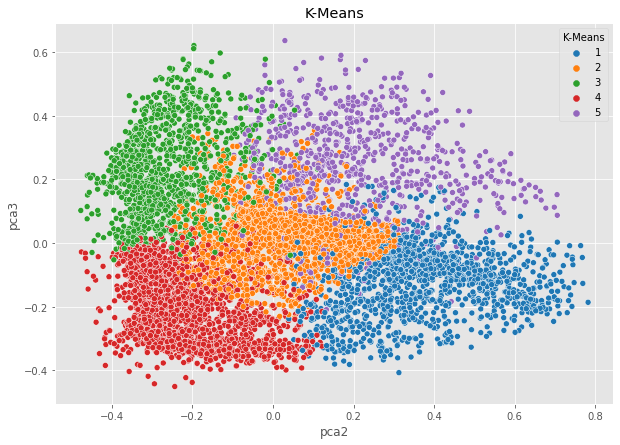

In [ ]:
# Visualization of clusters on the first PCs
for col in pca_df2.iloc[:,-5:]:
    plt.figure(figsize=(10, 7)) 
    plt.style.use('ggplot')
    ax = sns.scatterplot(x="pca2", y="pca3", hue = col, data = pca_df2, palette = 'tab10')
    ax.set_title(col)
    plt.show()

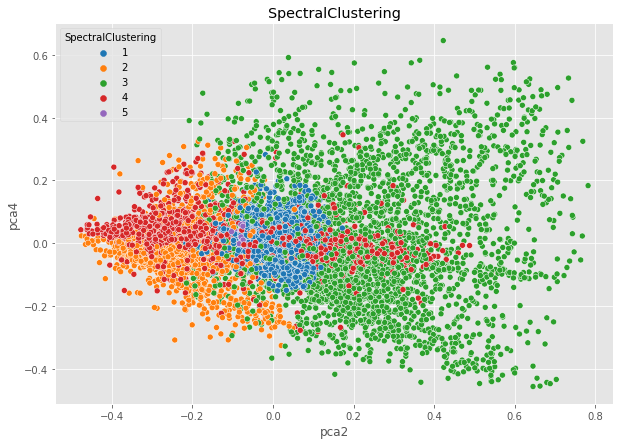

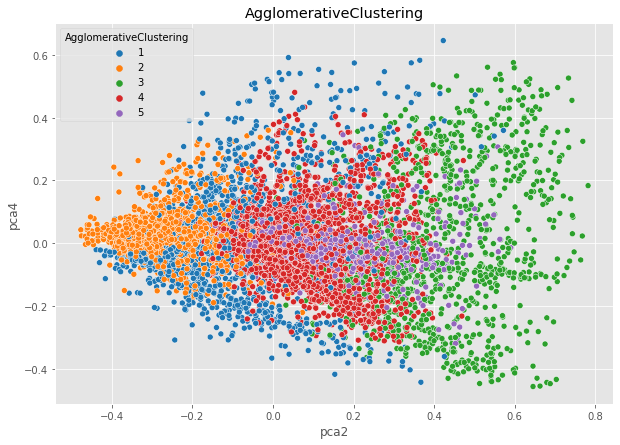

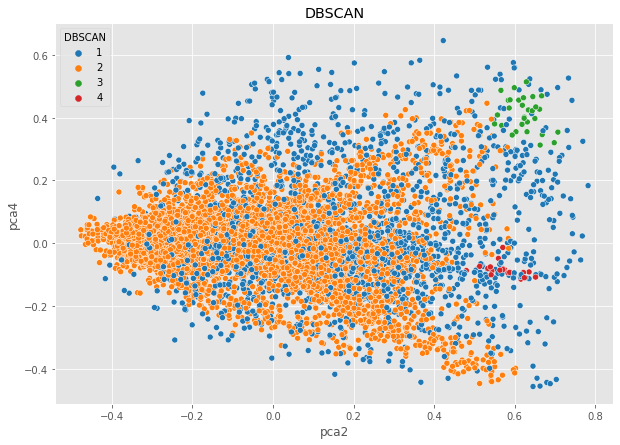

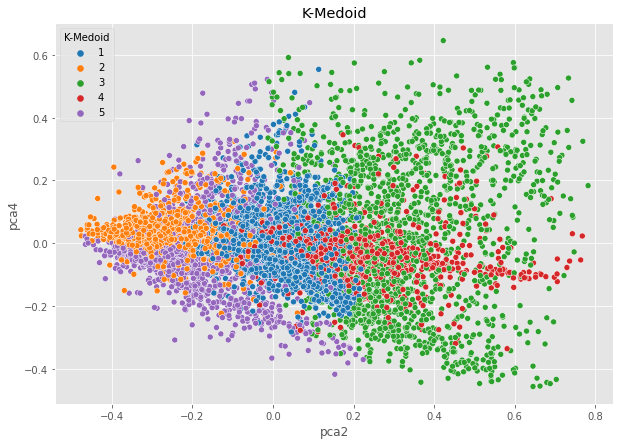

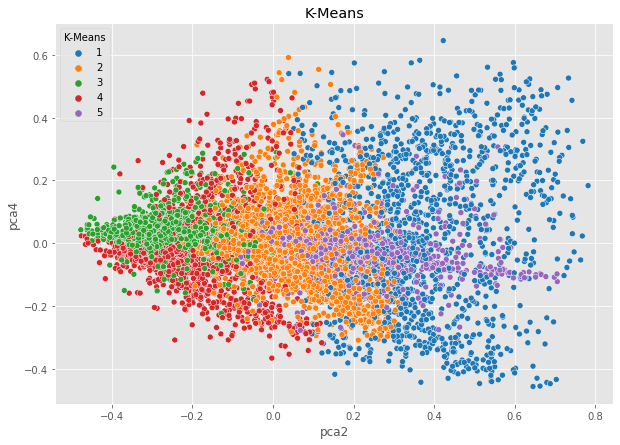

In [ ]:
# Visualization of clusters on the first PCs
for col in pca_df2.iloc[:,-5:]:
    plt.figure(figsize=(10, 7)) 
    plt.style.use('ggplot')
    ax = sns.scatterplot(x="pca2", y="pca4", hue = col, data = pca_df2, palette = 'tab10')
    ax.set_title(col)
    plt.show()

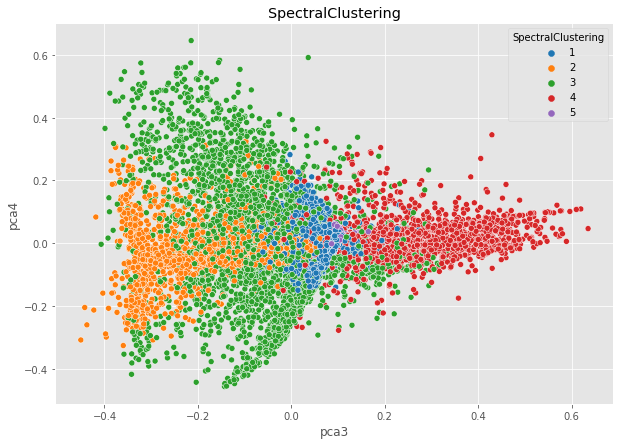

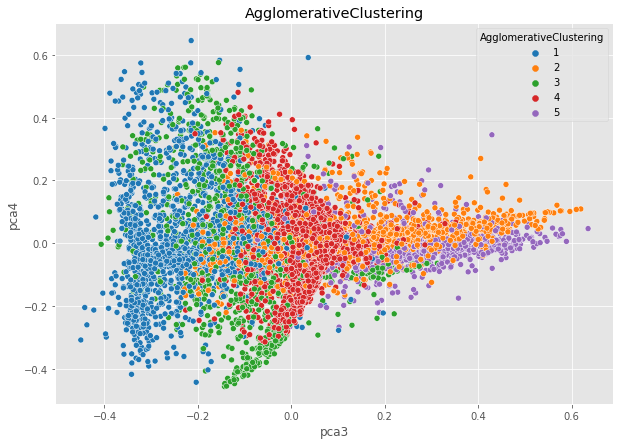

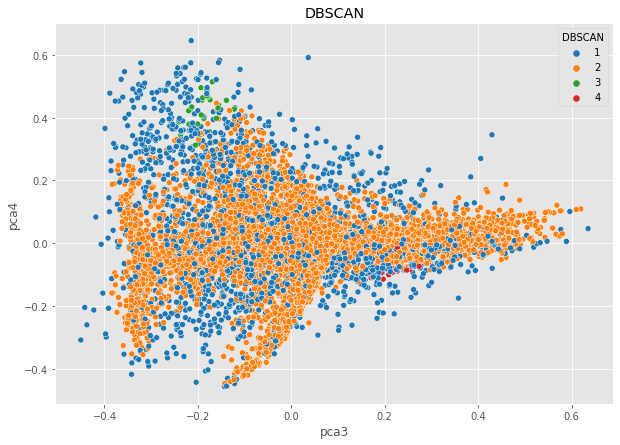

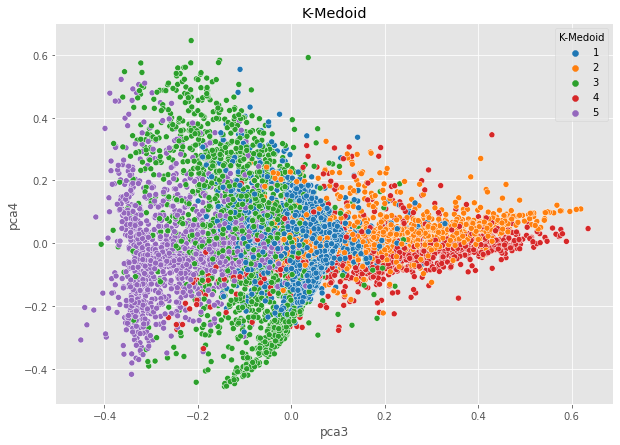

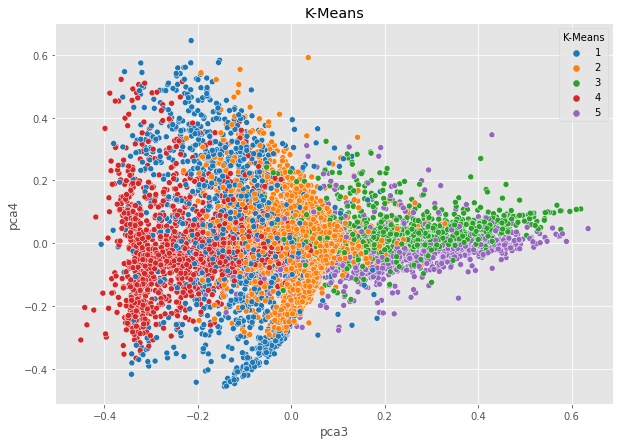

In [ ]:
# Visualization of clusters on the first PCs
for col in pca_df2.iloc[:,-5:]:
    plt.figure(figsize=(10, 7)) 
    plt.style.use('ggplot')
    ax = sns.scatterplot(x="pca3", y="pca4", hue = col, data = pca_df2, palette = 'tab10')
    ax.set_title(col)
    plt.show()

## Features Importance

In [ ]:
# Using the function included into the random classifiers and the clusters found as input
model = RandomForestClassifier()

# Define the parameters
X = df.iloc[:,:-5]
y_km = df.iloc[:,-1]
y_kme = df.iloc[:,-2]
y_db = df.iloc[:,-3]
y_ac = df.iloc[:,-4]
y_sc = df.iloc[:,-5]

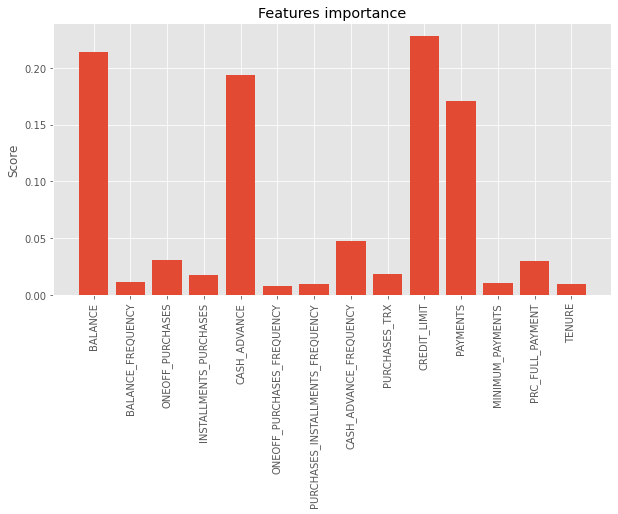

In [ ]:
# fit the model for kmeans
model.fit(X, y_km)
# get importance
importance = model.feature_importances_

# Plot feature importance
labels = X.columns.to_list()
plt.figure(figsize=(10,5))
pyplot.bar([x for x in labels], importance)
plt.xticks(rotation=90)
plt.title('Features importance')
plt.ylabel('Score')
pyplot.show()

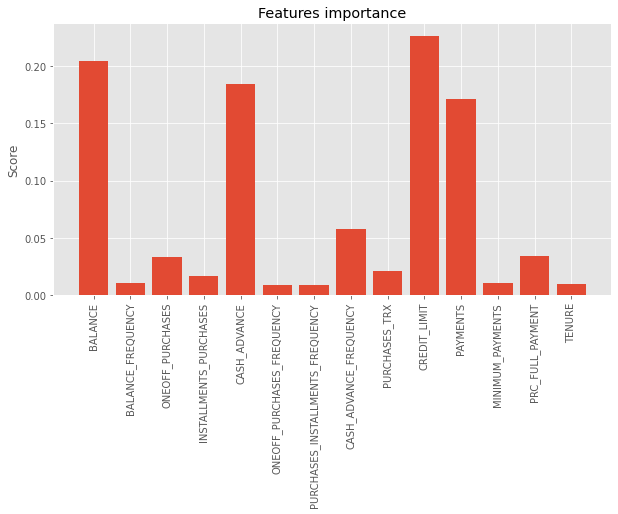

In [ ]:
# fit the model for kmedoids
model.fit(X, y_kme)
# get importance
importance = model.feature_importances_

# Plot feature importance
labels = X.columns.to_list()
plt.figure(figsize=(10,5))
pyplot.bar([x for x in labels], importance)
plt.xticks(rotation=90)
plt.title('Features importance')
plt.ylabel('Score')
pyplot.show()

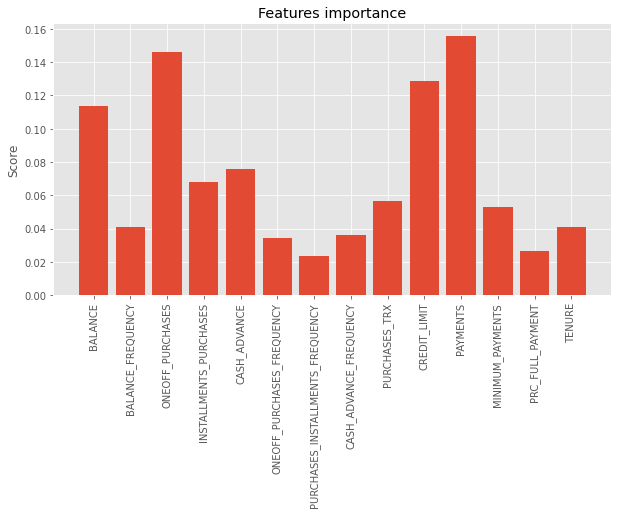

In [ ]:
# fit the model for DBSCAN
model.fit(X, y_db)
# get importance
importance = model.feature_importances_

# Plot feature importance
labels = X.columns.to_list()
plt.figure(figsize=(10,5))
pyplot.bar([x for x in labels], importance)
plt.xticks(rotation=90)
plt.title('Features importance')
plt.ylabel('Score')
pyplot.show()

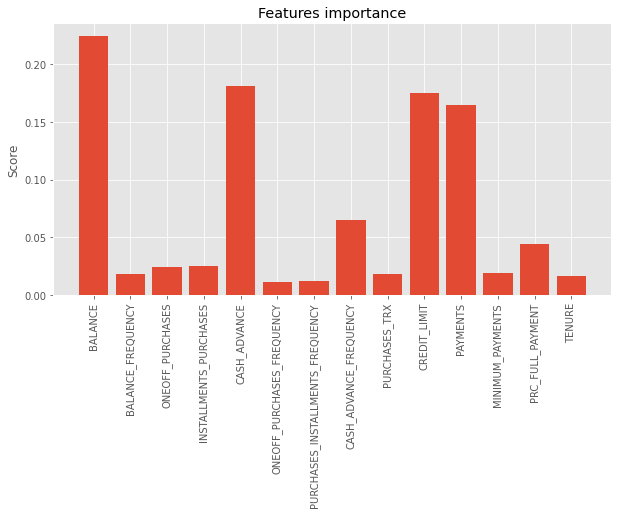

In [ ]:
# fit the model for agglomeratice clustering
model.fit(X, y_ac)
# get importance
importance = model.feature_importances_

# Plot feature importance
labels = X.columns.to_list()
plt.figure(figsize=(10,5))
pyplot.bar([x for x in labels], importance)
plt.xticks(rotation=90)
plt.title('Features importance')
plt.ylabel('Score')
pyplot.show()

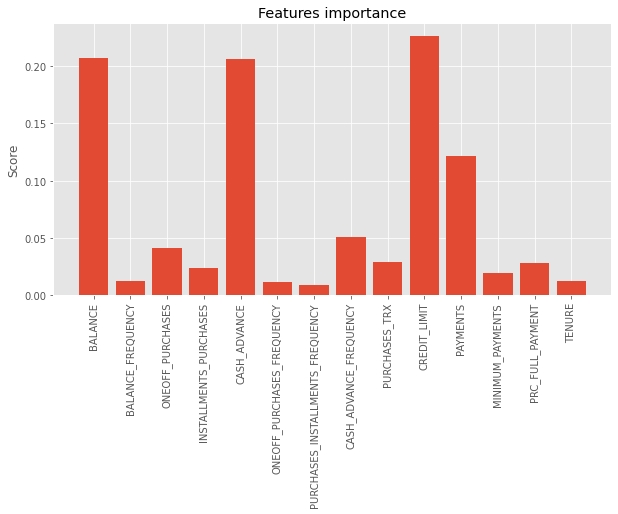

In [ ]:
# fit the model for spectral clustering
model.fit(X, y_sc)
# get importance
importance = model.feature_importances_

# Plot feature importance
labels = X.columns.to_list()
plt.figure(figsize=(10,5))
pyplot.bar([x for x in labels], importance)
plt.xticks(rotation=90)
plt.title('Features importance')
plt.ylabel('Score')
pyplot.show()

It appears that the most important parameters for the segmentation are: Credit Limit, Balance, Cash Advance, Payments; for all algorithms.

## Clustering 2nd iteration

Here we are applying the 3 best algorithms: K-Means, K-Medoids and Agglomerative Clustering on the most important features only.

In [ ]:
# Select explanatory variables
feat = ['CREDIT_LIMIT', 'BALANCE', 'CASH_ADVANCE', 'PAYMENTS']
tmp = df.loc[:,feat]
tmp.head()

,CREDIT_LIMIT,BALANCE,CASH_ADVANCE,PAYMENTS
CUST_ID,,,,
C10001,0.932827,0.038153,0.000000,0.188246
C10002,0.645223,0.295187,0.593877,0.378196
C10003,0.940751,0.312975,0.000000,0.078028
C10004,0.957789,0.212842,0.026280,0.000000
C10005,0.734835,0.500737,0.000000,0.415387


In [ ]:
# Fit models
km = KMeans(n_clusters=nc,n_init=ni, max_iter = miter, random_state= rds,init='k-means++').fit(tmp) 
kme = KMedoids(n_clusters=nc,max_iter = miter, method= 'pam', random_state= rds, init='k-medoids++').fit(tmp) 
#spectral = cluster.SpectralClustering(n_clusters=nc, n_init=ni, affinity="nearest_neighbors",random_state=rds).fit(tmp)
#dbscan = cluster.DBSCAN(eps= eps, min_samples=min_sample).fit(tmp)
ward = cluster.AgglomerativeClustering(n_clusters=nc, linkage='ward').fit(tmp)

In [ ]:
# Create columns with the corresponding cluster label in the dataset
#tmp["SpectralClustering"] = spectral.labels_ +1
tmp["AgglomerativeClustering"] = ward.labels_ +1
#tmp["DBSCAN"] = dbscan.labels_+2
tmp["K-Medoid"] = kme.labels_ +1
tmp["K-Means"] = km.labels_ +1 
tmp.head()

,CREDIT_LIMIT,BALANCE,CASH_ADVANCE,PAYMENTS,AgglomerativeClustering,K-Medoid,K-Means
CUST_ID,,,,,,,
C10001,0.932827,0.038153,0.000000,0.188246,1,2,3
C10002,0.645223,0.295187,0.593877,0.378196,4,5,4
C10003,0.940751,0.312975,0.000000,0.078028,1,2,3
C10004,0.957789,0.212842,0.026280,0.000000,1,2,3
C10005,0.734835,0.500737,0.000000,0.415387,3,4,2


In [ ]:
# Cluster size
idx = pd.Series([1,2,3,4,5])
frame = {'index':idx }
size2 = pd.DataFrame(frame)

for col in tmp.iloc[:,-3:].columns:
    tmp2 = pd.DataFrame(tmp.groupby(col).count().reset_index().iloc[:,:2].rename(columns={col:'index','CREDIT_LIMIT':col}))
    size2 = size2.merge(tmp2, on='index',how='left')
    size2.fillna(0,inplace=True)
    
size2

,index,AgglomerativeClustering,K-Medoid,K-Means
0,1,4010,1487,1382
1,2,1062,3317,2129
2,3,2329,1333,3453
3,4,857,1935,1214
4,5,692,878,772


# Cluster Analysis

### Comparisons Tests

The Mann-Whitney U test is a rank-based test that can be used to compare values for two groups. If we get a significant result it suggests that the values for the two groups are different. This test is equivalent to a two-sample Wilcoxon rank-sum test but for independant samples.
We don’t have to assume that our data is following the normal distribution and can decide whether the population distributions are identical. Now, the Mann–Whitney test does not address hypotheses about the medians of the groups.  Rather, the test addresses if it is likely that an observation in one group is greater than an observation in the other group.  In other words, it concerns whether one sample has stochastic dominance compared with the other.

We can use the Mann-Whitney U test when your outcome/dependent variable is either ordinal or continous but not normally distributed. Furthermore, this non-parametric test is used when you want to compare differences between two independent groups (e.g., such as an alternative to the two-sample t-test). 

- <b> Null hypothesis (H0) </b>: The two groups are sampled from populations with identical distributions.  Typically, the sampled populations exhibit stochastic equality.
- <b> Alternative hypothesis (H1) </b>: The two groups are sampled from populations with different distributions (see the previous section).  Most of the time, this means that one of the sampled populations (groups) displays stochastic dominance.

If we observe a large p-value, for example larger than 0.05 or 0.1, then we cannot reject the null hypothesis of identical average scores. If the p-value is smaller than the threshold, e.g. 1%, 5% or 10%, then we reject the null hypothesis of equal averages.

In [ ]:
# Carrying out the Wilcoxon–Mann–Whitney test for each combination of clusters and each features

feat = ['CREDIT_LIMIT', 'BALANCE', 'CASH_ADVANCE', 'PAYMENTS']
algo = ['AgglomerativeClustering','K-Medoid','K-Means']
tmp2 = tmp.loc[:,feat]
clus = np.arange(1,6)
comb = list(combinations(clus, 2))
results = []
colum = []
test = []
alg = []

for c in tmp2.columns:
  for k in algo:
    for i,j in comb:
      tmpc1 = tmp[tmp[k] == i][[c]]
      tmpc2 = tmp[tmp[k] == j][[c]]
    
      test.append((i,j))
      alg.append(k)
      colum.append(c)   
      results.append((mannwhitneyu(tmpc1, tmpc2))[1])
zipped = list(zip(colum, results))
zip2 = list(zip(alg,test))
results = list(zip(zip2,zipped))

In [ ]:
results

[(('AgglomerativeClustering', (1, 2)), ('CREDIT_LIMIT', 0.0)),
 (('AgglomerativeClustering', (1, 3)), ('CREDIT_LIMIT', 0.0)),
 (('AgglomerativeClustering', (1, 4)), ('CREDIT_LIMIT', 0.0)),
 (('AgglomerativeClustering', (1, 5)), ('CREDIT_LIMIT', 0.0)),
 (('AgglomerativeClustering', (2, 3)),
  ('CREDIT_LIMIT', 1.0894375472800536e-271)),
 (('AgglomerativeClustering', (2, 4)),
  ('CREDIT_LIMIT', 5.430561150113526e-104)),
 (('AgglomerativeClustering', (2, 5)),
  ('CREDIT_LIMIT', 1.5838110336279706e-47)),
 (('AgglomerativeClustering', (3, 4)),
  ('CREDIT_LIMIT', 1.090926423308062e-30)),
 (('AgglomerativeClustering', (3, 5)), ('CREDIT_LIMIT', 0.0)),
 (('AgglomerativeClustering', (4, 5)),
  ('CREDIT_LIMIT', 1.259408228601422e-207)),
 (('K-Medoid', (1, 2)), ('CREDIT_LIMIT', 0.0)),
 (('K-Medoid', (1, 3)), ('CREDIT_LIMIT', 1.182402006713012e-22)),
 (('K-Medoid', (1, 4)), ('CREDIT_LIMIT', 5.662578661991745e-31)),
 (('K-Medoid', (1, 5)), ('CREDIT_LIMIT', 1.1155051427287312e-94)),
 (('K-Medoid', (2,

<b> According to the Mann Whitney test, all clusters are significatively different from each others for all features. </b> Only the clusters (2, 3) found by 'K-Medoid', are not significatively different based on the feature PAYMENTS. (p-value = 0.46318912272177365).

### Violin Plot

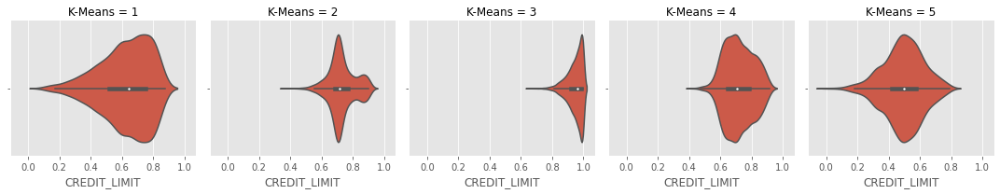

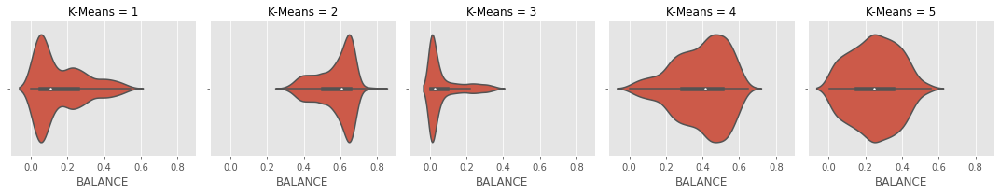

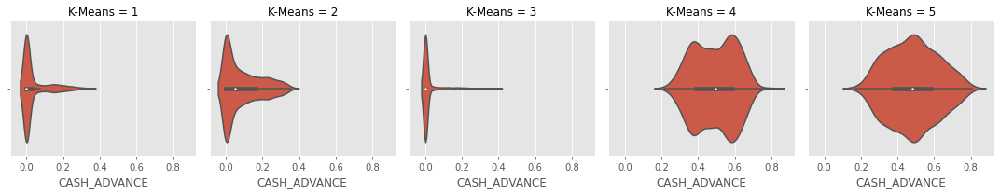

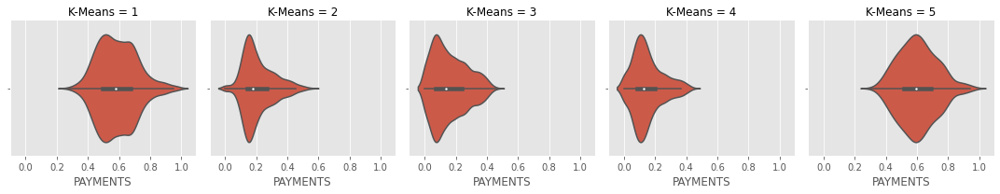

In [ ]:
# Plot a grid with the violin plots for all features of each clusters
for c in tmp.loc[:,feat]:
    grid= sns.FacetGrid(tmp, col='K-Means')
    grid.map(sns.violinplot,c,order=tmp['K-Means'].unique())

<b> Key characteristics of each clusters </b>

- <b> Cluster 1 </b> :
    - Broad range values for Balance, Payments and Credit limit. 
    - Relatively high amount of payments.

       <b> Group of customers who make broad amount of payments and have broad amount of money in their accounts. </b>  
    
- <b> Cluster 2 </b> : 
    - High amount of money on the account (Balance)
    - High credit limit
    - Low expenses (Payments)

     <b> Group of customers who have money and high possibility of credit but don't spend a lot and don't use the services of the bank (cash advance). </b>
    
    
- <b> Cluster 3 </b> : 
    - Relatively low amount of money on the accounts (Balance) and on payments.
    - Almost no usage of Cash Advance.
    - Highest credit limit.

      <b> Group of customers who have the highest credit limit but don't use the services of the bank (cash advance) and don't keep money on their accounts (Balance). </b>   
    
- Cluster 4: 
    - High credit limit value.
    - High usage of cash advance.
    - Broad range of values for Balance.

    <b> Group of customers using the services and products of the bank, with relatively some money available on their accounts but making mostly small/medium amount of expenses </b>
    
    
- Cluster 5: 
    <b> Group of customers that consume and use the products and services from the bank to make pucrhases. </b>
    

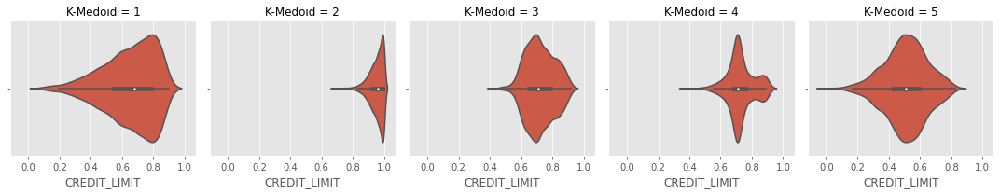

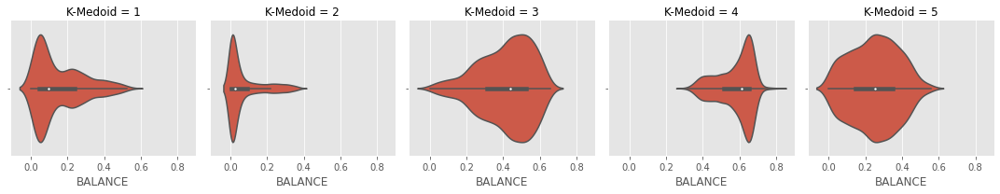

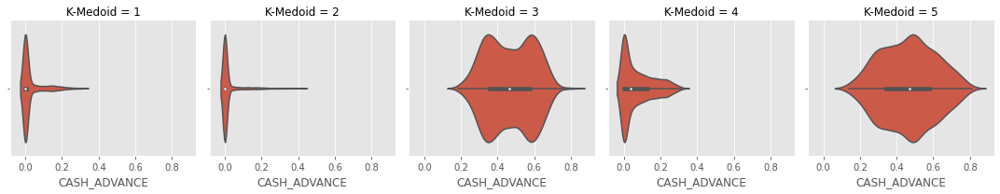

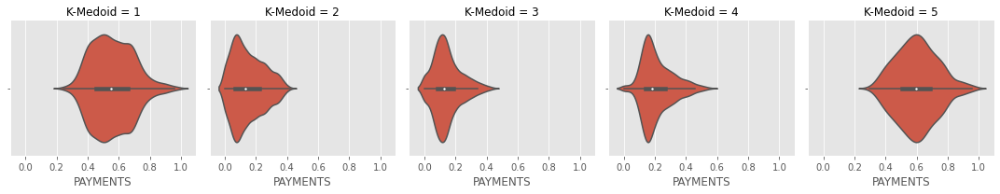

In [ ]:
# Plot a grid with the violin plots for all features of each clusters found by Kmeans
for c in tmp.loc[:,feat]:
    grid= sns.FacetGrid(tmp, col='K-Medoid')
    grid.map(sns.violinplot,c,order=tmp['K-Medoid'].unique())

<b> We got the same profile of clusters with K-medoid than with K-means. </b> The number assigned to the cluster vary but the distribution remains similar.

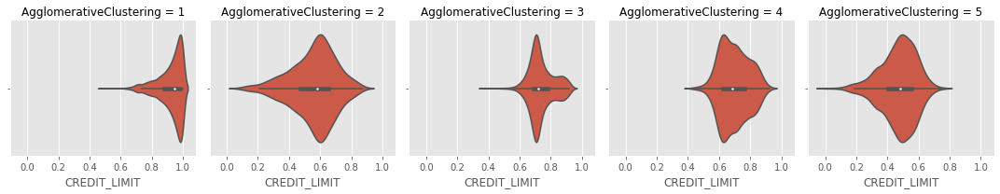

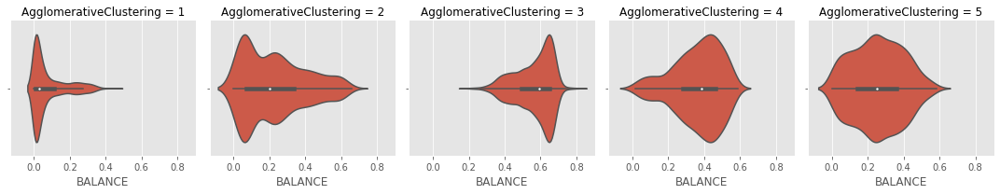

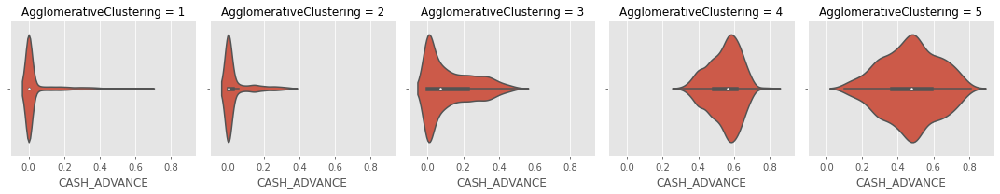

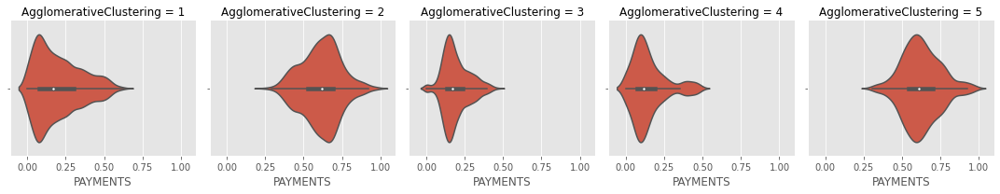

In [ ]:
# Plot a grid with the violin plots for all features of each clusters found by Kmeans
for c in tmp.loc[:,feat]:
    grid= sns.FacetGrid(tmp, col='AgglomerativeClustering')
    grid.map(sns.violinplot,c,order=tmp['AgglomerativeClustering'].unique())

<b> We got the same profile of clusters with Agglomerative Clustering than with K-means and K-medoid. </b> The number assigned to the cluster vary but the distribution remains similar.

In [ ]:
# Create column matching the clusters across the methods based on their distribution
  # We reassign the ID of the clusters based on Kmeans

tmp['ag_km'] = np.where(tmp['AgglomerativeClustering'] == 1, 3,np.where(tmp['AgglomerativeClustering'] == 2, 
                        1,np.where(tmp['AgglomerativeClustering'] == 3, 2,tmp['AgglomerativeClustering'])))

tmp['kme_km'] = np.where(tmp['K-Medoid'] == 2, 3,np.where(tmp['K-Medoid'] == 4, 
                        2,np.where(tmp['K-Medoid'] == 3, 4,tmp['K-Medoid'])))

In [ ]:
# Check the individuals that are not matching (not in the same clusters depending on the method applied)
tmp[~((tmp['K-Means'] == tmp['kme_km']) & (tmp['K-Means'] == tmp['ag_km']))]

,CREDIT_LIMIT,BALANCE,CASH_ADVANCE,PAYMENTS,AgglomerativeClustering,K-Medoid,K-Means,ag_km,kme_km
CUST_ID,,,,,,,,,
C10002,0.645223,0.295187,0.593877,0.378196,4,5,4,4,5
C10006,0.559475,0.562530,0.000000,0.435165,2,4,2,1,2
C10007,0.829941,0.038562,0.000000,0.390645,1,1,3,3,1
C10011,0.524714,0.565434,0.000000,0.473686,2,4,2,1,2
C10012,0.744316,0.234755,0.000000,0.262602,1,1,3,3,1
...,...,...,...,...,...,...,...,...,...
C19151,0.829096,0.295248,0.000000,0.098476,3,2,3,2,3
C19169,0.800607,0.049894,0.000000,0.365673,1,1,3,3,1
C19177,0.709942,0.077368,0.000000,0.430023,1,1,1,3,1
